# Exploratory Data Analysis (EDA)

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('tweet_emotions.csv')
df

,tweet_id,sentiment,content
0,1956967341,empty,@tiffanylue i know i was listenin to bad habi...
1,1956967666,sadness,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,sadness,Funeral ceremony...gloomy friday...
3,1956967789,enthusiasm,wants to hang out with friends SOON!
4,1956968416,neutral,@dannycastillo We want to trade with someone w...
...,...,...,...
39995,1753918954,neutral,@JohnLloydTaylor
39996,1753919001,love,Happy Mothers Day All my love
39997,1753919005,love,Happy Mother's Day to all the mommies out ther...
39998,1753919043,happiness,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


In [3]:
df=df.drop('tweet_id',axis=1)
df

,sentiment,content
0,empty,@tiffanylue i know i was listenin to bad habi...
1,sadness,Layin n bed with a headache ughhhh...waitin o...
2,sadness,Funeral ceremony...gloomy friday...
3,enthusiasm,wants to hang out with friends SOON!
4,neutral,@dannycastillo We want to trade with someone w...
...,...,...
39995,neutral,@JohnLloydTaylor
39996,love,Happy Mothers Day All my love
39997,love,Happy Mother's Day to all the mommies out ther...
39998,happiness,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


In [4]:
df.shape

(40000, 2)

In [5]:
df.describe()

,sentiment,content
count,40000,40000
unique,13,39827
top,neutral,I just received a mothers day card from my lov...
freq,8638,14


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  40000 non-null  object
 1   content    40000 non-null  object
dtypes: object(2)
memory usage: 625.1+ KB


In [7]:
df.isnull().sum()

sentiment    0
content      0
dtype: int64

In [8]:
df.duplicated().sum()

91

In [9]:
df["sentiment"].value_counts()

neutral       8638
worry         8459
happiness     5209
sadness       5165
love          3842
surprise      2187
fun           1776
relief        1526
hate          1323
empty          827
enthusiasm     759
boredom        179
anger          110
Name: sentiment, dtype: int64

<Axes: xlabel='sentiment', ylabel='count'>

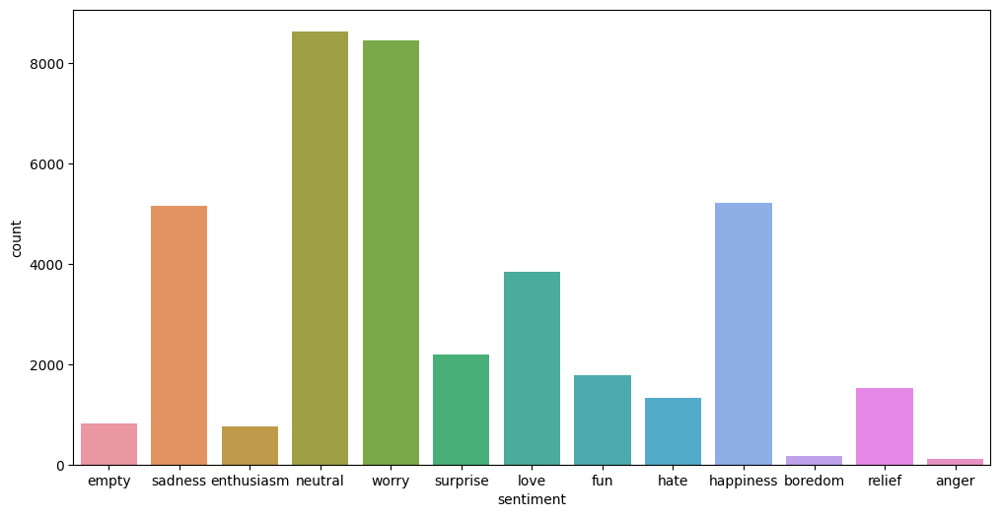

In [10]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment', data=df)

<Axes: xlabel='count', ylabel='sentiment'>

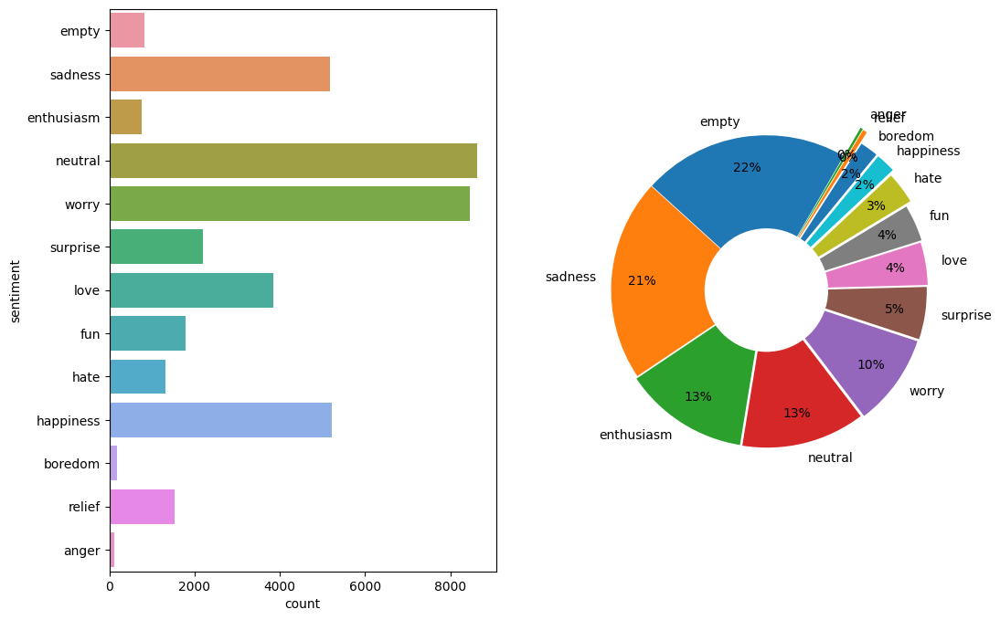

In [11]:
col = 'sentiment'
fig, (ax1, ax2)  = plt.subplots(nrows=1, ncols=2, figsize=(12,8))
explode = list((np.array(list(df[col].dropna().value_counts()))/sum(list(df[col].dropna().value_counts())))[::-1])[:]
labels = list(df[col].dropna().unique())[:]
sizes = df[col].value_counts()[:]
ax2.pie(sizes,  explode=explode, startangle=60, labels=labels, autopct='%1.0f%%', pctdistance=0.8)
ax2.add_artist(plt.Circle((0,0),0.4,fc='white'))
sns.countplot(y =col, data = df, ax=ax1)


There are 13 different classes and some of the are having very few examples. (i.e. Anger, Boredom, Empty etc...). This is a very imbalanced dataset and it will not allow the model to converge. We'll reduce the number of classes.

In [12]:
df['sentiment'] = df['sentiment'].apply(lambda x : x if x in ['happiness', 'sadness', 'worry', 'neutral', 'love','hate,','surprise','relief','fun'] else "other") 

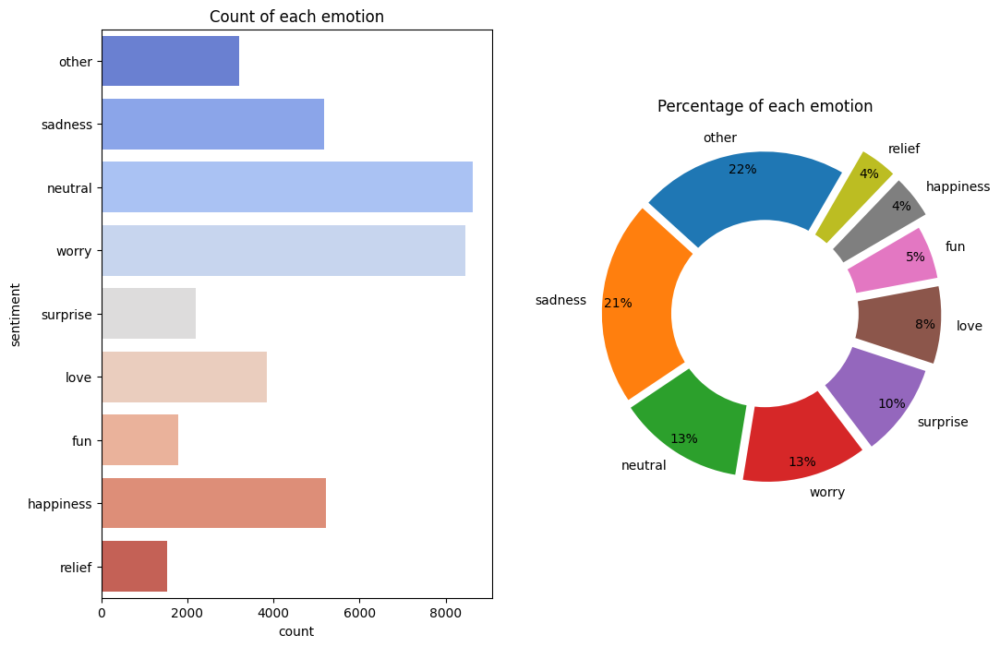

In [13]:
col = 'sentiment'
fig, (ax1, ax2)  = plt.subplots(nrows=1, ncols=2, figsize=(12,8))
explode = list((np.array(list(df[col].dropna().value_counts()))/sum(list(df[col].dropna().value_counts())))[::-1])[:10]
labels = list(df[col].dropna().unique())[:10]
sizes = df[col].value_counts()[:10]
#ax.pie(sizes, explode=explode, colors=bo, startangle=60, labels=labels,autopct='%1.0f%%', pctdistance=0.9)
ax2.pie(sizes,  explode=explode, startangle=60, labels=labels,autopct='%1.0f%%', pctdistance=0.9,)
ax2.add_artist(plt.Circle((0,0),0.6,fc='white'))
sns.countplot(y =col, data = df, ax=ax1,palette= "coolwarm")
ax1.set_title("Count of each emotion")
ax2.set_title("Percentage of each emotion")
plt.show()

In [14]:
df.sentiment.nunique()

9

### Distribution of character length and token length overall


In [15]:
df['char_length'] = df['content'].apply(lambda x : len(x))
df['token_length'] = df['content'].apply(lambda x : len(x.split(" ")))

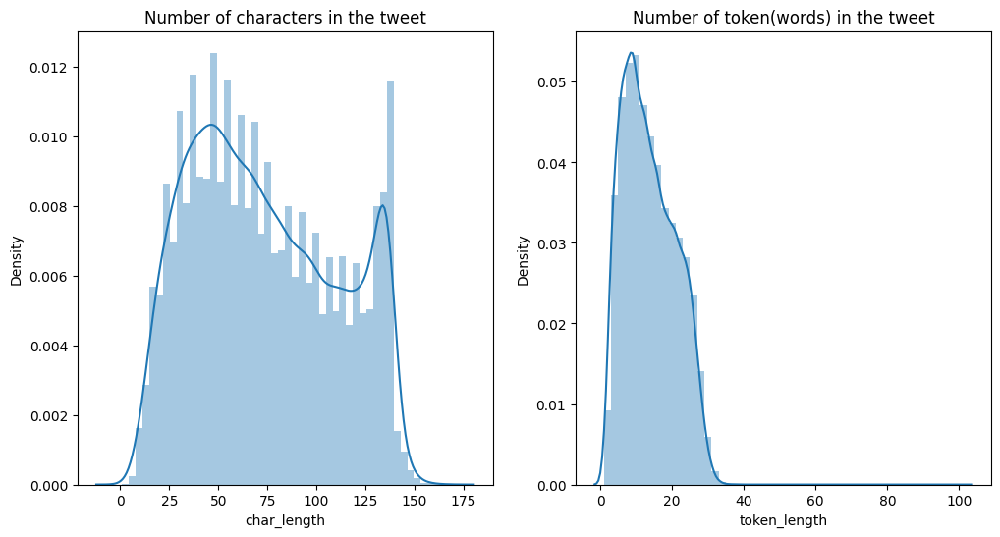

In [16]:
fig, (ax1, ax2)  = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
sns.distplot(df['char_length'], ax=ax1)
sns.distplot(df['token_length'], ax=ax2)
ax1.set_title('Number of characters in the tweet')
ax2.set_title('Number of token(words) in the tweet')
plt.show()

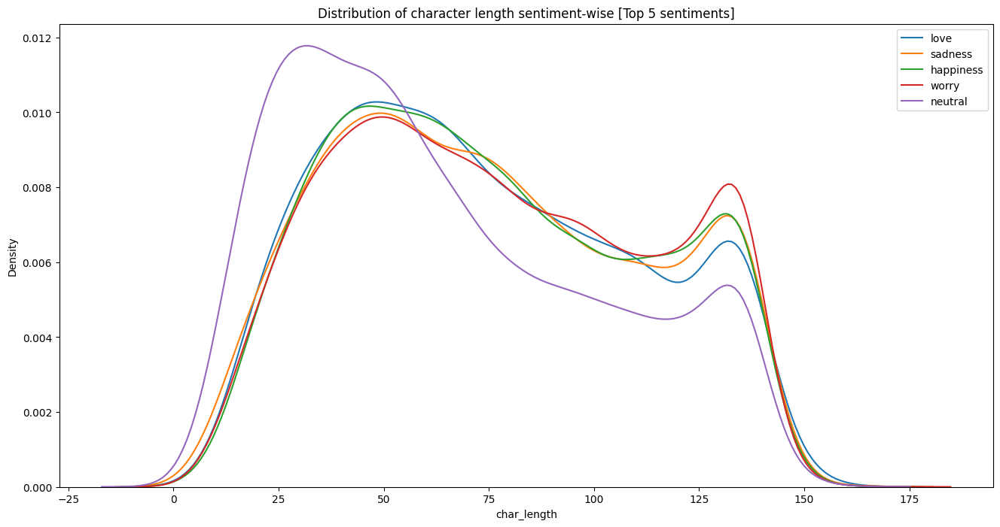

In [17]:
fig, ax = plt.subplots(figsize=(16,8))
for sentiment in df['sentiment'].value_counts().sort_values()[-5:].index.tolist():
    #print(sentiment)
    sns.kdeplot(df[df['sentiment']==sentiment]['char_length'],ax=ax, label=sentiment)
ax.legend()
ax.set_title("Distribution of character length sentiment-wise [Top 5 sentiments]")
plt.show()

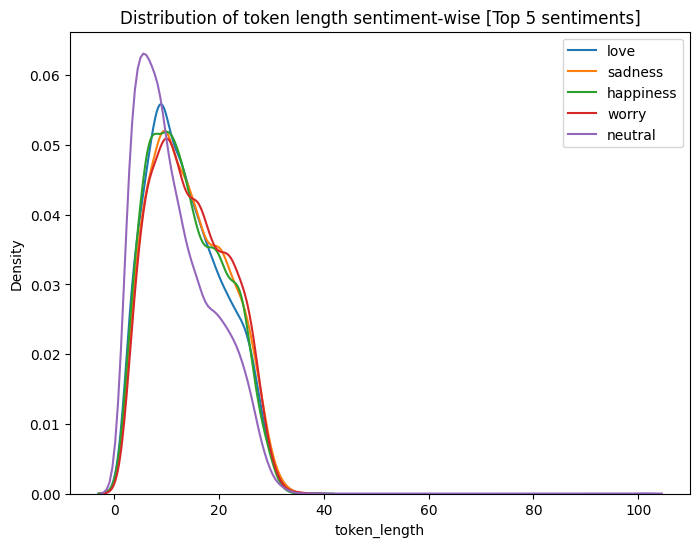

In [18]:
fig, ax = plt.subplots(figsize=(8,6))
for sentiment in df['sentiment'].value_counts().sort_values()[-5:].index.tolist():
    #print(sentiment)
    sns.kdeplot(df[df['sentiment']==sentiment]['token_length'],ax=ax, label=sentiment)
ax.legend()
ax.set_title("Distribution of token length sentiment-wise [Top 5 sentiments]")
plt.show()


In [19]:
avg_df = df.groupby('sentiment').agg({'char_length':'mean', 'token_length':'mean'})

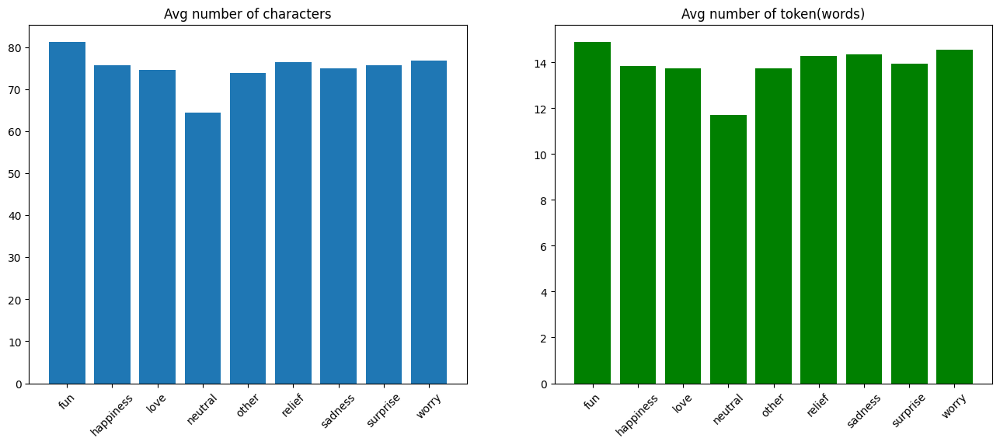

In [20]:
fig, (ax1, ax2)  = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
ax1.bar(avg_df.index, avg_df['char_length'])
ax2.bar(avg_df.index, avg_df['token_length'], color='green')
ax1.set_title('Avg number of characters')
ax2.set_title('Avg number of token(words)')
ax1.set_xticklabels(avg_df.index, rotation = 45)
ax2.set_xticklabels(avg_df.index, rotation = 45)
plt.show()

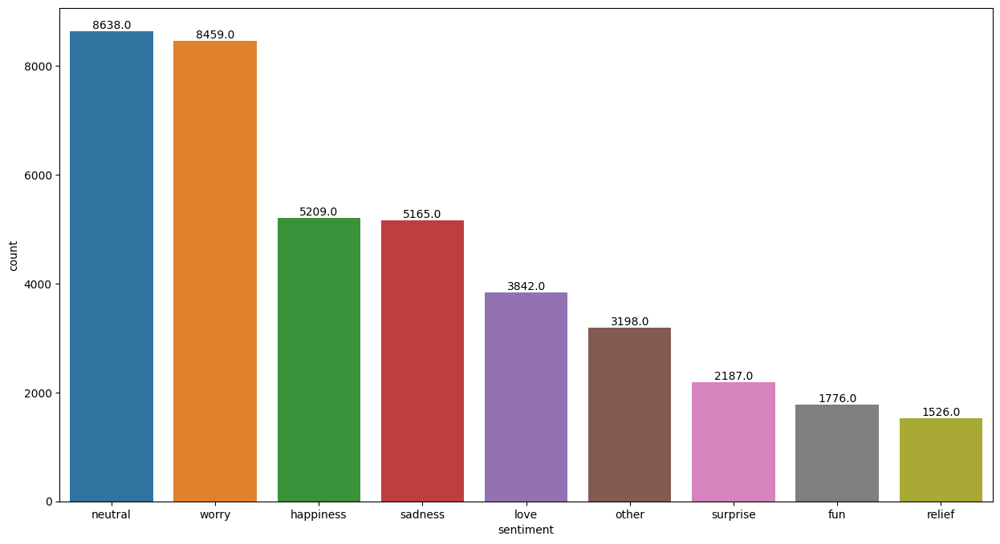

In [21]:
sentiment = df['sentiment'].value_counts()
sentiment_order = list(sentiment.index)

plt.figure(figsize=(15,8))

ax = sns.countplot(x='sentiment', data=df, order=sentiment_order)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{height}", (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=10)
    
plt.show;

# Text processing

In [22]:
df_clean = df.copy()

In [23]:
#%pip install contractions
#%pip install inflect
#%pip install transformers
#%pip install lime

In [24]:
import contractions
import nltk
from nltk import pos_tag

from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer

from sklearn.model_selection import  train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score 

from tabulate import tabulate
from wordcloud import WordCloud

#Lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from lime.lime_text import explanation
sns.set(font_scale=1.3)


In [25]:
nltk.download('omw-1.4')
nltk.download("stopwords")
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\kamal\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kamal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
#### text preprocessing
from nltk.stem import  LancasterStemmer, WordNetLemmatizer
from bs4 import BeautifulSoup
import re, string, unicodedata
import inflect

def text_preprocessing(df, text_col, remove_stopwords=True):
    
    ## Define functions for individual steps
    # First function is used to denoise text
    def denoise_text(text):
        # Strip html if any. For ex. removing <html>, <p> tags
        soup = BeautifulSoup(text, "html.parser")
        text = soup.get_text()
        # Replace contractions in the text. For ex. didn't -> did not
        text = contractions.fix(text)
        return text
    
    def remove_non_ascii(words):
        """Remove non-ASCII characters from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        return new_words
    
    
    def to_lowercase(words):
        """Convert all characters to lowercase from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = word.lower()
            new_words.append(new_word)
        return new_words
    
    
    def remove_punctuation(words):
        """Remove punctuation from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = re.sub(r'[^\w\s]', '', word)
            if new_word != '':
                new_words.append(new_word)
        return new_words
    
    
    def replace_numbers(words):
        """Replace all interger occurrences in list of tokenized words with textual representation"""
        p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
        return new_words
    
    
    def remove_stopwords(words):
        """Remove stop words from list of tokenized words"""
        new_words = []
        for word in words:
            if word not in stopwords.words('english'):
                new_words.append(word)
        return new_words
    
    
    def stem_words(words):
        """Stem words in list of tokenized words"""
        stemmer = LancasterStemmer()
        stems = []
        for word in words:
            stem = stemmer.stem(word)
            stems.append(stem)
        return stems
    
    
    def lemmatize_verbs(words):
        """Lemmatize verbs in list of tokenized words"""
        lemmatizer = WordNetLemmatizer()
        lemmas = []
        for word in words:
            lemma = lemmatizer.lemmatize(word, pos='v')
            lemmas.append(lemma)
        return lemmas
    
    
    ### A wrap-up function for normalization
    def normalize_text(words, remove_stopwords):
        words = remove_non_ascii(words)
        words = to_lowercase(words)
        words = remove_punctuation(words)
        words = replace_numbers(words)
        if remove_stopwords:
            words = remove_stopwords(words)
        #words = stem_words(words)
        words = lemmatize_verbs(words)
        return words
    
    def tokenize(text):
        return nltk.word_tokenize(text)
    
    
    # A overall wrap-up function
    def text_prepare(text):
        text = denoise_text(text)
        text = ' '.join([x for x in normalize_text(tokenize(text), remove_stopwords)])
        return text
    
    # run every-step
    df[text_col] = [text_prepare(x) for x in df[text_col]]
    
    
    # return processed df
    return df

In [27]:
import nltk
##nltk.download('all')
print("Before Text Preprocessing")
display(df_clean.head()[['content']])
processed_df = text_preprocessing(df_clean, 'content', remove_stopwords=False)
print("After Text Preprocessing")
display(processed_df.head()[['content']])

Before Text Preprocessing


,content
0,@tiffanylue i know i was listenin to bad habi...
1,Layin n bed with a headache ughhhh...waitin o...
2,Funeral ceremony...gloomy friday...
3,wants to hang out with friends SOON!
4,@dannycastillo We want to trade with someone w...


In [ ]:
processed_df

,sentiment,content,char_length,token_length
0,other,tiffanylue know listenin bad habit earlier sta...,92,19
1,sadness,layin n bed headache ughhhh waitin call,60,11
2,sadness,funeral ceremony gloomy friday,35,3
3,other,want hang friends soon,36,7
4,neutral,dannycastillo want trade someone houston ticke...,86,15
...,...,...,...,...
39995,neutral,johnlloydtaylor,16,1
39996,love,happy mother day love,30,7
39997,love,happy mother day mommies woman man long momma ...,123,25
39998,happiness,niariley wassup beautiful follow peep new hit ...,122,20


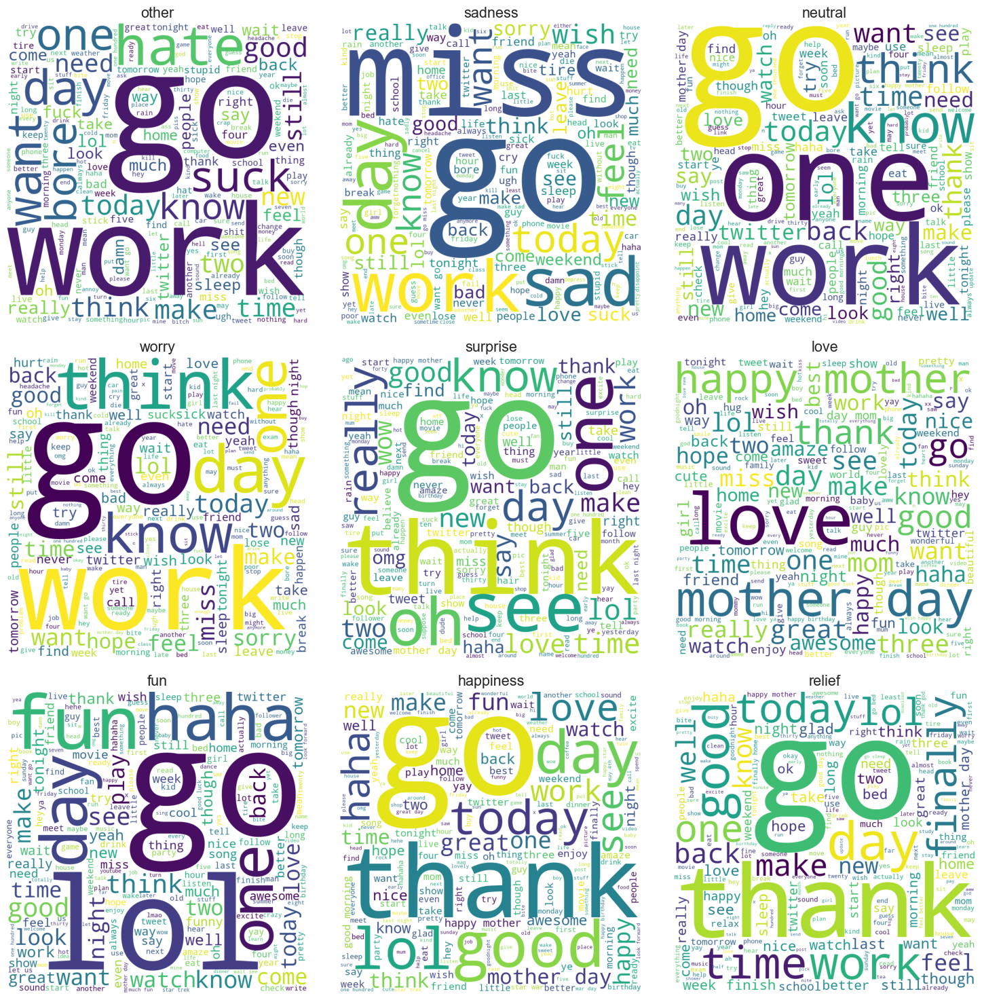

In [ ]:
sentiments = processed_df['sentiment'].unique()
sentiments = list(sentiments)
sentiments = list(sentiments) + list(sentiments[:3])

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))

for ax, sentiment in zip(axes.flatten(), sentiments):
    text = " ".join(processed_df[processed_df['sentiment'] == sentiment]['content'])
    cloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(text)
    ax.imshow(cloud)
    ax.set_title(sentiment)
    ax.axis("off")

plt.tight_layout()
plt.show()

# Modeling

#### TF-IDF
The word counts suffer some issues: most frequent words are usually not important (like stop words), while they take high focus/count.

TFIDF (Term Frequency - Inverse Document) is a way to adjust those counts:

TF: #mentions within a document

IDF: #mentions across all docs

So it gives higher importance to rare words across all docs (IDF++, TFIDF--), while it emphasyses on words appearing mostly in THIS doc (TF++, TFIDF--).

If a word appearing only in the current doc/sentence, it has TFIDF=1. If a word appears in all docs/sents but not the current one, it has TFIDF=0. If a word (stop word for example) appearing a lot in the current doc/sent and also in ALL others, it will have high TF (count) and much higher IDF (discount), so low TFIDF overall.

### Label encoding target column

In [ ]:
train_df=processed_df.copy()

In [ ]:
# Label encoding target column
# le = LabelEncoder()
# train_df['sentiment_le'] = le.fit_transform(train_df['sentiment'])

## df for training and prediction


## Spliting dataset 

In [ ]:
X=train_df['content']
y=train_df['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix 
def get_train(model, data, targets):
    # Create a Pipeline object with a TfidfVectorizer and the given model
    text_clf = Pipeline([('vect',TfidfVectorizer()),
                         ('clf', model)])
    # Fit the model on the data and targets
    text_clf.fit(data, targets)
    return text_clf

def get_F1(trained_model,X,y):
   
    # Make predictions on the input data using the trained model
    predicted=trained_model.predict(X)
    # Calculate the F1 score for the predictions
    f1=f1_score(y,predicted, average=None)
    # Return the F1 score
    return f1

## Logistic Regression model 

In [ ]:
from sklearn.linear_model import LogisticRegression
log_reg = get_train(LogisticRegression(solver='liblinear',random_state = 0), X_train, y_train)

In [ ]:
#Make a single prediction
y_pred_lr=log_reg.predict(['Happy'])
y_pred_lr

array(['happiness'], dtype=object)

In [ ]:
#test the model with the test data
y_pred_lr=log_reg.predict(X_test)
y_pred_lr

array(['happiness', 'worry', 'worry', ..., 'love', 'worry', 'worry'],
      dtype=object)

In [ ]:
#calculate the accuracy
log_reg_accuracy = accuracy_score(y_test, y_pred_lr)
print('Accuracy: ', log_reg_accuracy,'\n')

#calculate the F1 score
f1_Score_Lr = get_F1(log_reg,X_test,y_test)
pd.DataFrame(f1_Score_Lr, index=train_df.sentiment.unique(), columns=['F1 score'])

Accuracy:  0.3496969696969697 



,F1 score
other,0.029268
sadness,0.342652
neutral,0.457852
worry,0.423845
surprise,0.165205
love,0.061538
fun,0.288992
happiness,0.060686
relief,0.382533


In [ ]:
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

         fun       0.15      0.02      0.03       555
   happiness       0.33      0.36      0.34      1736
        love       0.49      0.43      0.46      1247
     neutral       0.35      0.55      0.42      2886
       other       0.37      0.11      0.17      1059
      relief       0.47      0.03      0.06       547
     sadness       0.38      0.23      0.29      1718
    surprise       0.33      0.03      0.06       688
       worry       0.32      0.48      0.38      2764

    accuracy                           0.35     13200
   macro avg       0.35      0.25      0.25     13200
weighted avg       0.35      0.35      0.32     13200



In [ ]:
explainer_LR = LimeTextExplainer(class_names=log_reg.classes_)
idx  = 4736
print("Actual Text : ", X_test[idx])
print("Prediction : ", log_reg.predict(X_test)[idx])
print("Actual :     ", y_test[idx])
exp = explainer_LR.explain_instance(X_test[idx], log_reg.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  think cheap sunglasses fall apart oh well
Prediction :  happiness
Actual :      sadness


## Decision Tree model

In [ ]:
from sklearn.tree import DecisionTreeClassifier
#Train the model with the training data
DT = get_train(DecisionTreeClassifier(random_state = 0), X_train, y_train)

#test the model with the test data
y_pred_dt=DT.predict(X_test)

#calculate the accuracy
DT_accuracy = accuracy_score(y_test, y_pred_dt)
print('Accuracy: ', DT_accuracy,'\n')

#calculate the F1 score
f1_Score_dt = get_F1(DT,X_test,y_test)
pd.DataFrame(f1_Score_dt, index=train_df.sentiment.unique(), columns=['F1 score']) 

Accuracy:  0.2692424242424242 



,F1 score
other,0.089304
sadness,0.268581
neutral,0.333982
worry,0.361013
surprise,0.156348
love,0.051168
fun,0.236752
happiness,0.066144
relief,0.300831


In [ ]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

         fun       0.11      0.08      0.09       555
   happiness       0.26      0.27      0.27      1736
        love       0.32      0.34      0.33      1247
     neutral       0.34      0.39      0.36      2886
       other       0.18      0.14      0.16      1059
      relief       0.07      0.04      0.05       547
     sadness       0.25      0.22      0.24      1718
    surprise       0.08      0.06      0.07       688
       worry       0.28      0.32      0.30      2764

    accuracy                           0.27     13200
   macro avg       0.21      0.21      0.21     13200
weighted avg       0.26      0.27      0.26     13200



In [ ]:
explainer_dt = LimeTextExplainer(class_names=DT.classes_)
idx  = 4736
print("Actual Text : ", X_test[idx])
print("Prediction : ", DT.predict(X_test)[idx])
print("Actual :     ", y_test[idx])
exp = explainer_dt.explain_instance(X_test[idx], DT.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  think cheap sunglasses fall apart oh well
Prediction :  fun
Actual :      sadness


## Support Vector Machine model

In [ ]:
from sklearn.svm import SVC
#Train the model with the training data
SVM = get_train(SVC(random_state = 0,probability=True), X_train, y_train)

#test the model with the test data
y_pred_svc=SVM.predict(X_test)

#calculate the accuracy
SVM_accuracy = accuracy_score(y_test, y_pred_svc)
print('Accuracy: ', SVM_accuracy,'\n')

#calculate the F1 score
f1_Score_svc = get_F1(SVM,X_test,y_test)
pd.DataFrame(f1_Score_svc, index=train_df.sentiment.unique(), columns=['F1 score']) 

Accuracy:  0.34674242424242424 



,F1 score
other,0.003460
sadness,0.343575
neutral,0.454183
worry,0.427489
surprise,0.140802
love,0.031469
fun,0.245783
happiness,0.032922
relief,0.384184


In [ ]:
##Classification Report
print(classification_report(y_test, y_pred_svc))

              precision    recall  f1-score   support

         fun       0.04      0.00      0.00       555
   happiness       0.33      0.35      0.34      1736
        love       0.51      0.41      0.45      1247
     neutral       0.34      0.59      0.43      2886
       other       0.35      0.09      0.14      1059
      relief       0.36      0.02      0.03       547
     sadness       0.40      0.18      0.25      1718
    surprise       0.29      0.02      0.03       688
       worry       0.32      0.48      0.38      2764

    accuracy                           0.35     13200
   macro avg       0.33      0.24      0.23     13200
weighted avg       0.34      0.35      0.31     13200



In [ ]:
explainer_svc = LimeTextExplainer(class_names=SVM.classes_)
idx  = 4736
print("Actual Text : ", X_test[idx])
print("Prediction : ", SVM.predict(X_test)[idx])
print("Actual :     ", y_test[idx])
exp = explainer_svc.explain_instance(X_test[idx], SVM.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  think cheap sunglasses fall apart oh well
Prediction :  worry
Actual :      sadness


## Random Forest model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
#Train the model with the training data
RF = get_train(RandomForestClassifier(random_state = 0), X_train, y_train)

#test the model with the test data
y_pred_rf=RF.predict(X_test)

#calculate the accuracy
RF_accuracy = accuracy_score(y_test, y_pred_rf)
print('Accuracy: ', RF_accuracy,'\n')

#calculate the F1 score
f1_Score_rf = get_F1(RF, X_test, y_test)
pd.DataFrame(f1_Score_rf, index=train_df.sentiment.unique(), columns=['F1 score']) 

Accuracy:  0.3362121212121212 



,F1 score
other,0.039939
sadness,0.313679
neutral,0.441494
worry,0.421674
surprise,0.161533
love,0.035088
fun,0.264260
happiness,0.058182
relief,0.370599


In [ ]:
##Classification Report
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

         fun       0.14      0.02      0.04       555
   happiness       0.32      0.31      0.31      1736
        love       0.46      0.43      0.44      1247
     neutral       0.33      0.57      0.42      2886
       other       0.29      0.11      0.16      1059
      relief       0.14      0.02      0.04       547
     sadness       0.35      0.21      0.26      1718
    surprise       0.18      0.03      0.06       688
       worry       0.32      0.43      0.37      2764

    accuracy                           0.34     13200
   macro avg       0.28      0.24      0.23     13200
weighted avg       0.32      0.34      0.31     13200



In [ ]:
explainer_rf = LimeTextExplainer(class_names=RF.classes_)
idx  = 4736
print("Actual Text : ", X_test[idx])
print("Prediction : ", RF.predict(X_test)[idx])
print("Actual :     ", y_test[idx])
exp = explainer_rf.explain_instance(X_test[idx], RF.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  think cheap sunglasses fall apart oh well
Prediction :  worry
Actual :      sadness


# MultinomialNB

In [ ]:
from sklearn.naive_bayes import MultinomialNB 
#Train the model with the training data
mn = get_train(MultinomialNB(), X_train, y_train)

#test the model with the test data
y_pred_mn=mn.predict(X_test)

#calculate the accuracy
mn_accuracy = accuracy_score(y_test, y_pred_rf)
print('Accuracy: ', mn_accuracy,'\n')

#calculate the F1 score
f1_Score_mn = get_F1(mn, X_test, y_test)
pd.DataFrame(f1_Score_mn, index=train_df.sentiment.unique(), columns=['F1 score']) 

Accuracy:  0.3362121212121212 



,F1 score
other,0.000000
sadness,0.195502
neutral,0.252038
worry,0.364233
surprise,0.000000
love,0.000000
fun,0.016920
happiness,0.000000
relief,0.389390


In [ ]:
##Classification Report
print(classification_report(y_test, y_pred_mn))

              precision    recall  f1-score   support

         fun       0.00      0.00      0.00       555
   happiness       0.39      0.13      0.20      1736
        love       0.58      0.16      0.25      1247
     neutral       0.31      0.44      0.36      2886
       other       0.00      0.00      0.00      1059
      relief       0.00      0.00      0.00       547
     sadness       0.27      0.01      0.02      1718
    surprise       0.00      0.00      0.00       688
       worry       0.26      0.76      0.39      2764

    accuracy                           0.29     13200
   macro avg       0.20      0.17      0.14     13200
weighted avg       0.26      0.29      0.21     13200



In [ ]:
explainer_mn = LimeTextExplainer(class_names=mn.classes_)
idx  = 4736
print("Actual Text : ", X_test[idx])
print("Prediction : ", mn.predict(X_test)[idx])
print("Actual :     ", y_test[idx])
exp = explainer_mn.explain_instance(X_test[idx], mn.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  think cheap sunglasses fall apart oh well
Prediction :  worry
Actual :      sadness


## Comparision of models

In [ ]:
models = pd.DataFrame({
    'Model': ['Logistic Regression', 'Decision Tree','Support Vector Machine','Random Forest','MultinomialNB'],
    'Accuracy': [log_reg_accuracy.round(2), DT_accuracy.round(2), SVM_accuracy.round(2), RF_accuracy.round(2),mn_accuracy.round(2)]})

models.sort_values(by='Accuracy', ascending=False).reset_index().drop(['index'], axis=1)

,Model,Accuracy
0,Logistic Regression,0.35
1,Support Vector Machine,0.35
2,Random Forest,0.34
3,MultinomialNB,0.34
4,Decision Tree,0.27


# Save Model

In [ ]:
# Save Model & Pipeline
import joblib
pipeline_file = open("model.pkl","wb")
joblib.dump(log_reg,pipeline_file)
pipeline_file.close()

Testing with example

In [ ]:

loaded_model = joblib.load(open('model.pkl', 'rb'))

In [ ]:
# Make A Prediction
ex1 = "im mad at you"
x=loaded_model.predict([ex1])
x[0]

'neutral'